In [164]:
import os
from glob import glob
import pandas as pd
import numpy as np
import torch
import timm
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.dataset import random_split
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
from math import ceil
from tqdm.notebook import tqdm
import wandb
from torch_lr_finder import LRFinder
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pickle import load

In [6]:
from scipy import ndimage

### Paths definition

In [12]:
train_data_directory = r'../train_data'
test_data_directory = r'../test_data'
saved_models_directory = r'../saved_models'
submissions_directory = r'../submissions'

### Ground Truth Exploratory analysis

In [104]:
temp_gt = pd.read_csv(os.path.join(train_data_directory, 'train_gt.csv'))[
    ['sample_index', 'P', 'K', 'Mg', 'pH']]

In [105]:
temp_gt

,sample_index,P,K,Mg,pH
0,0,45.1,188.0,179.0,7.2
1,1,44.8,205.0,188.0,7.0
2,2,44.4,207.0,145.0,6.8
3,3,46.5,204.0,143.0,6.8
4,4,52.0,212.0,167.0,6.7
...,...,...,...,...,...
1727,1727,40.8,133.0,132.0,6.2
1728,1728,42.7,192.0,126.0,6.5
1729,1729,39.4,180.0,122.0,6.5
1730,1730,37.3,162.0,127.0,6.5


#### Stats

In [143]:
temp_gt[['P', 'K', 'Mg', 'pH']].describe()

,P,K,Mg,pH
count,1732.000000,1732.000000,1732.000000,1732.000000
mean,70.302656,227.988510,159.281236,6.782719
std,29.504784,61.891989,39.871829,0.260298
min,20.300000,21.100000,26.800000,5.600000
25%,51.175000,189.000000,134.000000,6.600000
50%,65.100000,216.000000,155.000000,6.800000
75%,82.225000,252.000000,181.000000,6.900000
max,325.000000,625.000000,400.000000,7.800000


In [22]:
temp_gt[['P', 'K', 'Mg', 'pH']].mean(axis=0)

P      70.302656
K     227.988510
Mg    159.281236
pH      6.782719
dtype: float64

In [23]:
temp_gt[['P', 'K', 'Mg', 'pH']].median(axis=0)

P      65.1
K     216.0
Mg    155.0
pH      6.8
dtype: float64

In [8]:
temp_gt[['P', 'K', 'Mg', 'pH']].mad(axis=0)

P     20.888682
K     44.693169
Mg    30.087340
pH     0.200171
dtype: float64

In [9]:
temp_gt[['P', 'K', 'Mg', 'pH']].var(axis=0)

P      870.532298
K     3830.618360
Mg    1589.762761
pH       0.067755
dtype: float64

#### Plots

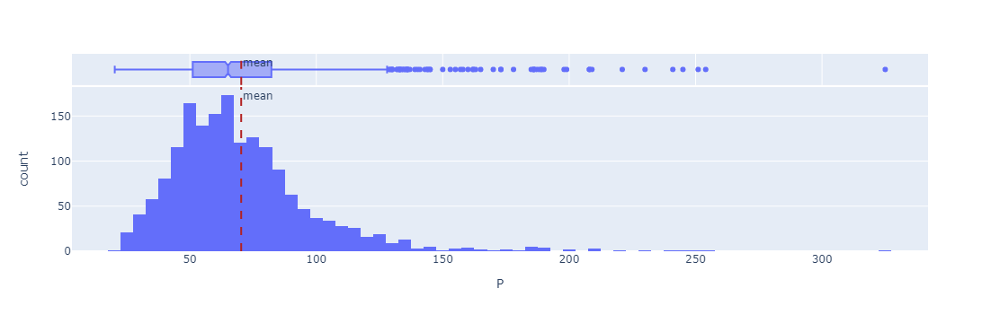

In [10]:
var = 'P'
fig = px.histogram(temp_gt, x=var, marginal='box')
fig.add_vline(x=np.mean(temp_gt[var]), line_dash = 'dash', line_color = 'firebrick', annotation_text='mean')
fig.show()

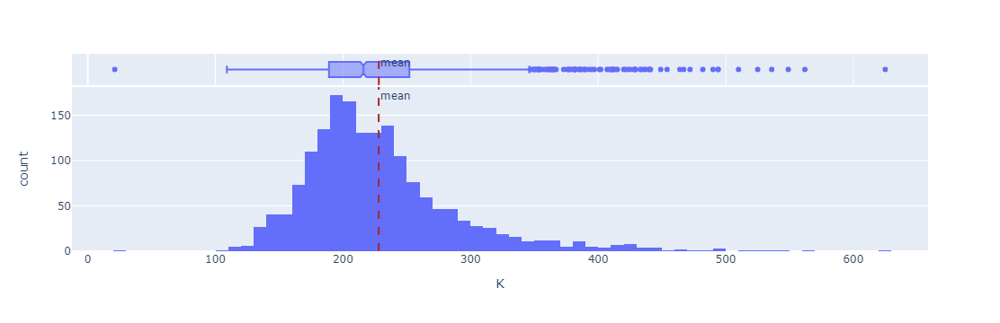

In [11]:
var = 'K'
fig = px.histogram(temp_gt, x=var, marginal='box')
fig.add_vline(x=np.mean(temp_gt[var]), line_dash = 'dash', line_color = 'firebrick', annotation_text='mean')
fig.show()

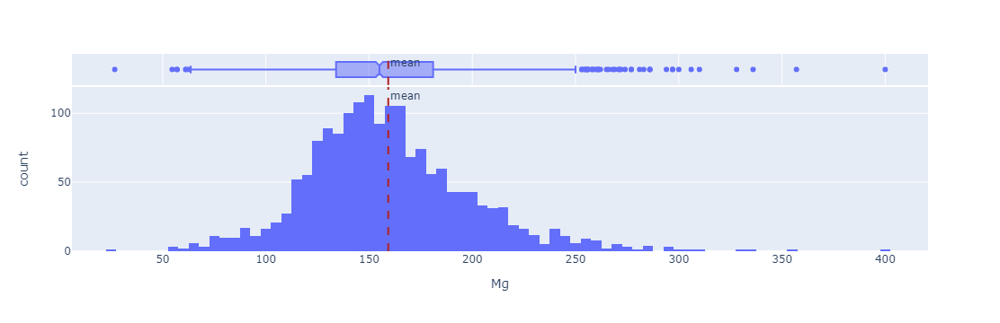

In [12]:
var = 'Mg'
fig = px.histogram(temp_gt, x=var, marginal='box')
fig.add_vline(x=np.mean(temp_gt[var]), line_dash = 'dash', line_color = 'firebrick', annotation_text='mean')
fig.show()

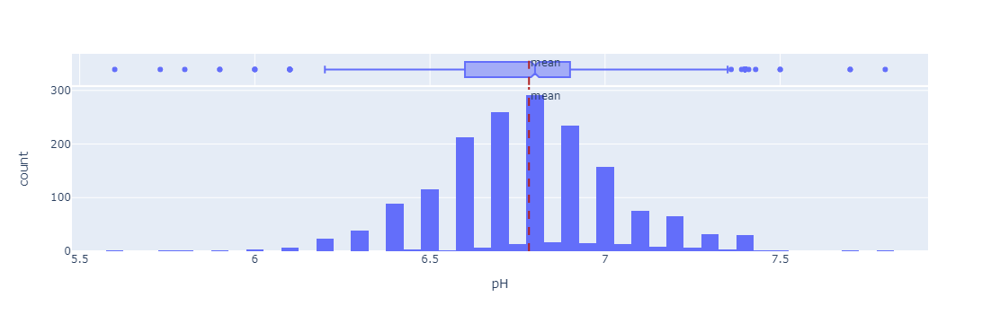

In [13]:
var = 'pH'
fig = px.histogram(temp_gt, x=var, marginal='box')
fig.add_vline(x=np.mean(temp_gt[var]), line_dash = 'dash', line_color = 'firebrick', annotation_text='mean')
fig.show()

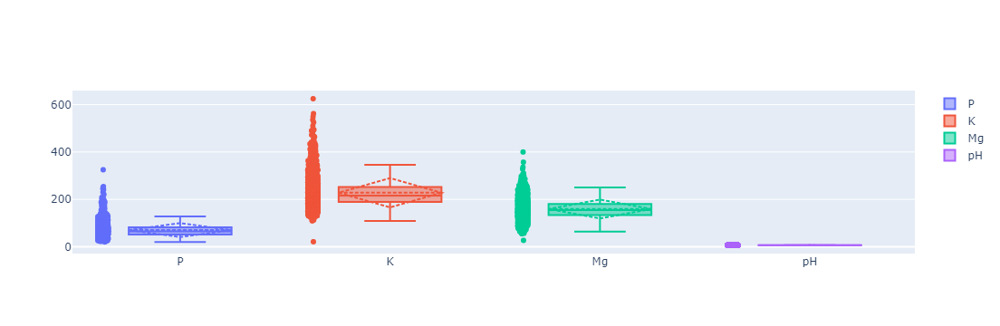

In [14]:
fig = go.Figure()
fig.add_trace(go.Box(y=temp_gt.P, name="P", boxmean='sd'))
fig.add_trace(go.Box(y=temp_gt.K, name="K", boxmean='sd'))
fig.add_trace(go.Box(y=temp_gt.Mg, name="Mg", boxmean='sd'))
fig.add_trace(go.Box(y=temp_gt.pH, name="pH", boxmean='sd'))
fig.update_traces(boxpoints='all', jitter=0.1)
fig.show()

## Image size vs parameter value

### Create DF with image sizes, non-zero pixels count and all pixels count

#### Load Images

In [13]:
# List with image files
img_files = np.array(
            sorted(
                glob(os.path.join(train_data_directory, 'train_data', "*.npz")),
                key=lambda x: int(os.path.basename(x).replace(".npz", "")),
            )
        )
img_files

array(['../train_data/train_data/0.npz', '../train_data/train_data/1.npz',
       '../train_data/train_data/2.npz', ...,
       '../train_data/train_data/1729.npz',
       '../train_data/train_data/1730.npz',
       '../train_data/train_data/1731.npz'], dtype='<U33')

In [69]:
images_sizes = dict()
for i in range(0, img_files.shape[0]):
    img_arr = np.ma.MaskedArray(**np.load(img_files[i]))
    img_width_length = img_arr.shape[1:3]
    
    img_tensor = torch.as_tensor(img_arr.data, dtype=torch.float)
    # Inverting mask is necessary due to masking method in numpy
    img_tensor_mask = ~torch.as_tensor(img_arr.mask)
    img_masked_tensor = torch.mul(img_tensor, img_tensor_mask)
    
    nonzero_pixels = img_masked_tensor[0].count_nonzero().item()
    all_pixels = img_width_length[0] * img_width_length[1]
    
    images_sizes[i] = [img_width_length[0], img_width_length[1], all_pixels, nonzero_pixels]
    
    if i % 100 == 0:
        print(i)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700


In [103]:
images_sizes_df = pd.DataFrame.from_dict({ key: pd.Series(val) for key, val in images_sizes.items() }, orient='index')
images_sizes_df.rename(columns={0:'width', 1:'length', 2:'all_pixels', 3:'nonzero_pixels'}, inplace=True)
images_sizes_df

,width,length,all_pixels,nonzero_pixels
0,11,11,121,79
1,11,11,121,78
2,11,11,121,78
3,11,11,121,77
4,11,11,121,78
...,...,...,...,...
1727,66,123,8118,4398
1728,137,133,18221,9862
1729,132,130,17160,9193
1730,125,127,15875,8524


#### Scale parameters values

In [130]:
scaler_P = load((open(os.path.join(train_data_directory, 'standard_scaler_P.pkl'), 'rb')))
scaler_K = load((open(os.path.join(train_data_directory, 'standard_scaler_K.pkl'), 'rb')))
scaler_Mg = load((open(os.path.join(train_data_directory, 'standard_scaler_Mg.pkl'), 'rb')))
scaler_pH = load((open(os.path.join(train_data_directory, 'standard_scaler_pH.pkl'), 'rb')))

In [131]:
temp_gt['P_scaled'] = pd.Series(scaler_P.transform(np.array(temp_gt['P']).reshape(-1, 1)).ravel())
temp_gt['K_scaled'] = pd.Series(scaler_K.transform(np.array(temp_gt['K']).reshape(-1, 1)).ravel())
temp_gt['Mg_scaled'] = pd.Series(scaler_Mg.transform(np.array(temp_gt['Mg']).reshape(-1, 1)).ravel())
temp_gt['pH_scaled'] = pd.Series(scaler_pH.transform(np.array(temp_gt['pH']).reshape(-1, 1)).ravel())

#### Concat DF with images sizes and parameter values

In [132]:
parameters_values_images_sizes_df = pd.concat([temp_gt, images_sizes_df], axis=1)
parameters_values_images_sizes_df

,sample_index,P,K,Mg,pH,P_scaled,K_scaled,Mg_scaled,pH_scaled,width,length,all_pixels,nonzero_pixels
0,0,45.1,188.0,179.0,7.2,-0.854435,-0.646288,0.494697,1.603550,11,11,121,79
1,1,44.8,205.0,188.0,7.0,-0.864606,-0.371537,0.720485,0.834979,11,11,121,78
2,2,44.4,207.0,145.0,6.8,-0.878167,-0.339213,-0.358282,0.066407,11,11,121,78
3,3,46.5,204.0,143.0,6.8,-0.806972,-0.387699,-0.408457,0.066407,11,11,121,77
4,4,52.0,212.0,167.0,6.7,-0.620508,-0.258404,0.193645,-0.317879,11,11,121,78
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1727,1727,40.8,133.0,132.0,6.2,-1.000217,-1.535190,-0.684421,-2.239308,66,123,8118,4398
1728,1728,42.7,192.0,126.0,6.5,-0.935802,-0.581641,-0.834947,-1.086451,137,133,18221,9862
1729,1729,39.4,180.0,122.0,6.5,-1.047680,-0.775583,-0.935297,-1.086451,132,130,17160,9193
1730,1730,37.3,162.0,127.0,6.5,-1.118876,-1.066496,-0.809859,-1.086451,125,127,15875,8524


In [133]:
# save DataFrame to csv
parameters_values_images_sizes_df.to_csv(os.path.join(train_data_directory, 'DataFrame_parameters_values_images_sizes.csv'))

In [134]:
parameters_values_images_sizes_df.describe()

,sample_index,P,K,Mg,pH,P_scaled,K_scaled,Mg_scaled,pH_scaled,width,length,all_pixels,nonzero_pixels
count,1732.00000,1732.000000,1732.000000,1732.000000,1732.000000,1.732000e+03,1.732000e+03,1.732000e+03,1.732000e+03,1732.000000,1732.000000,1732.000000,1732.000000
mean,865.50000,70.302656,227.988510,159.281236,6.782719,-5.743417e-17,5.743417e-17,1.723025e-16,1.411240e-15,58.103349,58.941109,5648.593533,3347.661085
std,500.12965,29.504784,61.891989,39.871829,0.260298,1.000289e+00,1.000289e+00,1.000289e+00,1.000289e+00,49.175281,49.462518,6853.659231,3949.142738
min,0.00000,20.300000,21.100000,26.800000,5.600000,-1.695220e+00,-3.343700e+00,-3.323637e+00,-4.545023e+00,11.000000,11.000000,121.000000,73.000000
25%,432.75000,51.175000,189.000000,134.000000,6.600000,-6.484772e-01,-6.301263e-01,-6.342457e-01,-7.021648e-01,11.000000,11.000000,121.000000,79.000000
50%,865.50000,65.100000,216.000000,155.000000,6.800000,-1.763835e-01,-1.937565e-01,-1.074060e-01,6.640690e-02,42.000000,42.000000,1764.000000,1108.000000
75%,1298.25000,82.225000,252.000000,181.000000,6.900000,4.041984e-01,3.880700e-01,5.448718e-01,4.506927e-01,107.000000,108.000000,11474.250000,7482.250000
max,1731.00000,325.000000,625.000000,400.000000,7.800000,8.634901e+00,6.416439e+00,6.039058e+00,3.909265e+00,268.000000,284.000000,37488.000000,14451.000000


#### Plots of scaled parameters

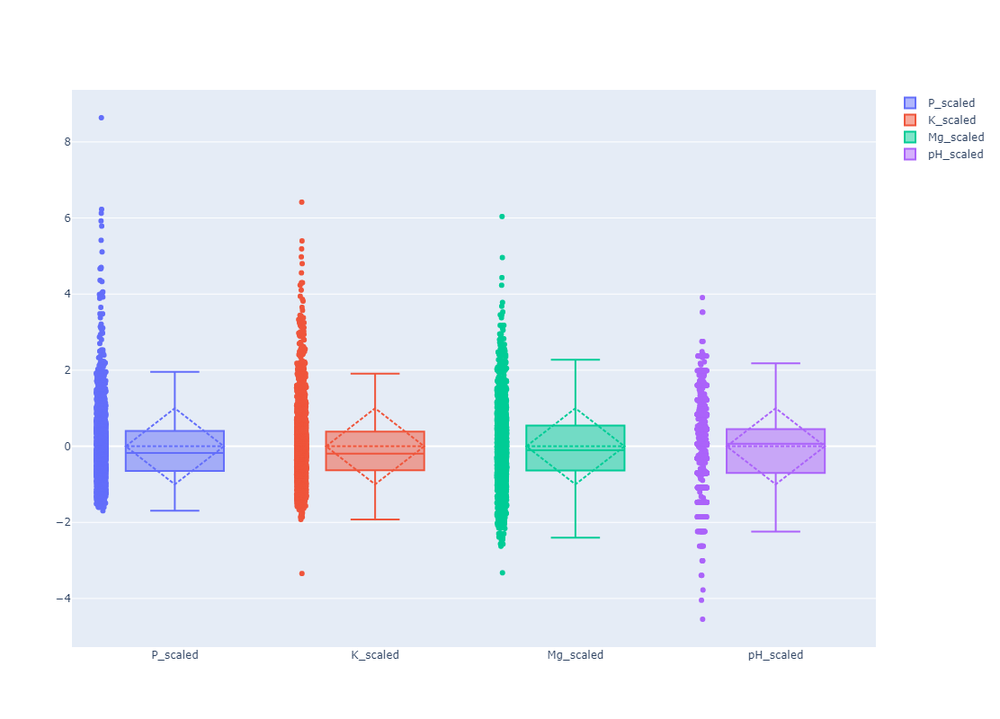

In [174]:
fig = go.Figure()
fig.add_trace(go.Box(y=parameters_values_images_sizes_df.P_scaled, name="P_scaled", boxmean='sd'))
fig.add_trace(go.Box(y=parameters_values_images_sizes_df.K_scaled, name="K_scaled", boxmean='sd'))
fig.add_trace(go.Box(y=parameters_values_images_sizes_df.Mg_scaled, name="Mg_scaled", boxmean='sd'))
fig.add_trace(go.Box(y=parameters_values_images_sizes_df.pH_scaled, name="pH_scaled", boxmean='sd'))
fig.update_traces(boxpoints='all', jitter=0.1)
fig.update_layout(autosize=True, height=800)
fig.show()

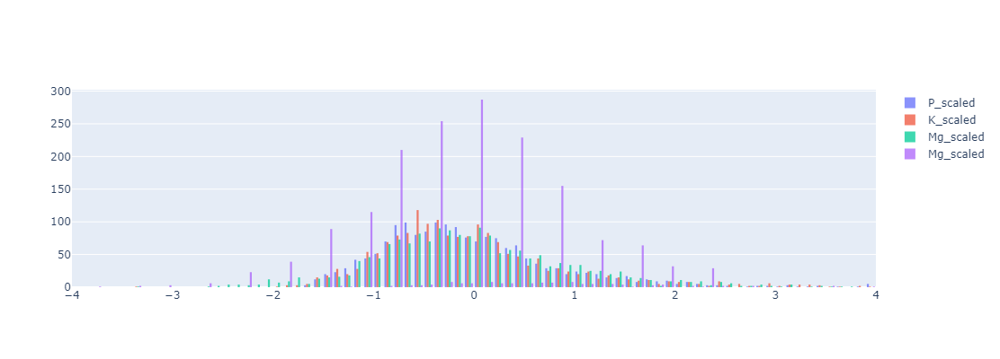

In [175]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.P_scaled, name="P_scaled"))
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.K_scaled, name="K_scaled"))
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.Mg_scaled, name="Mg_scaled"))
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.pH_scaled, name="Mg_scaled"))
# fig.update_layout(barmode='overlay')
fig.update_layout(autosize=True, width=1100, height=400)
fig.update_xaxes(range=(-4, 4))
fig.update_traces(opacity=0.75)
fig.show()

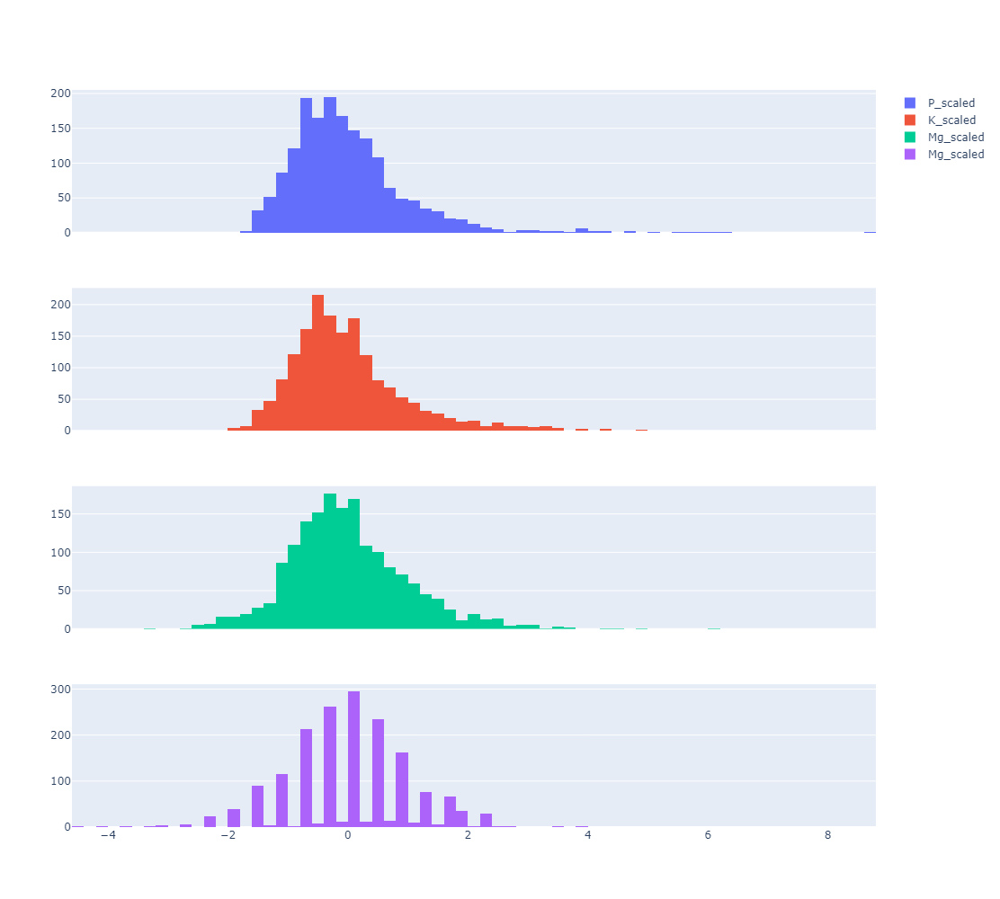

In [176]:
fig = make_subplots(rows=4, cols=1, shared_xaxes=True)
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.P_scaled, name="P_scaled"), row=1,col=1)
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.K_scaled, name="K_scaled"), row=2,col=1)
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.Mg_scaled, name="Mg_scaled"), row=3,col=1)
fig.add_trace(go.Histogram(x=parameters_values_images_sizes_df.pH_scaled, name="pH_scaled"), row=4,col=1)
fig.update_layout(autosize=True, width=1100, height=1000)
fig.show()

In [199]:
from sklearn.linear_model import LinearRegression

In [204]:
def create_plot_histogram_scatter(param1, param2):
    fig = go.Figure()
#     param1 = 'P_scaled'
#     param2 = 'K_scaled'
    x_param = parameters_values_images_sizes_df[param1]
    y_param = parameters_values_images_sizes_df[param2]

    model = LinearRegression()
    model.fit(np.array(x_param).reshape(-1,1), np.array(y_param).reshape(-1,1))

    fig.add_trace(go.Histogram2dContour(
            x = x_param,
            y = y_param,
            colorscale = 'Blues',
            reversescale = True,
            xaxis = 'x',
            yaxis = 'y'
        ))
    fig.add_trace(go.Scattergl(x=x_param, y=y_param, mode='markers',marker = dict(color = 'rgba(237, 8, 23, 0.5)',size = 3), xaxis='x', yaxis='y'))
    fig.add_traces(go.Scattergl(x=x_param, y=pd.Series(model.predict(np.array(x_param).reshape(-1,1)).ravel()), name='Regression Fit'))
    fig.add_trace(go.Histogram(
            y = y_param,
            xaxis = 'x2',
            marker = dict(
                color = 'rgba(0,0,0,1)'
            )
        ))
    fig.add_trace(go.Histogram(
            x = x_param,
            yaxis = 'y2',
            marker = dict(
                color = 'rgba(0,0,0,1)'
            )
        ))

    fig.update_layout(xaxis_title=param1, yaxis_title=param2)
    fig.update_layout(autosize = False,
        xaxis = dict(
            zeroline = False,
            domain = [0,0.85],
            showgrid = False
        ),
        yaxis = dict(
            zeroline = False,
            domain = [0,0.85],
            showgrid = False
        ),
        xaxis2 = dict(
            zeroline = False,
            domain = [0.85,1],
            showgrid = False
        ),
        yaxis2 = dict(
            zeroline = False,
            domain = [0.85,1],
            showgrid = False
        ),
        height = 800,
        width = 1000,
        bargap = 0,
        hovermode = 'closest',
        showlegend = False
    )
    fig.show()

#### Plots of dependence of parameters in relation to each other

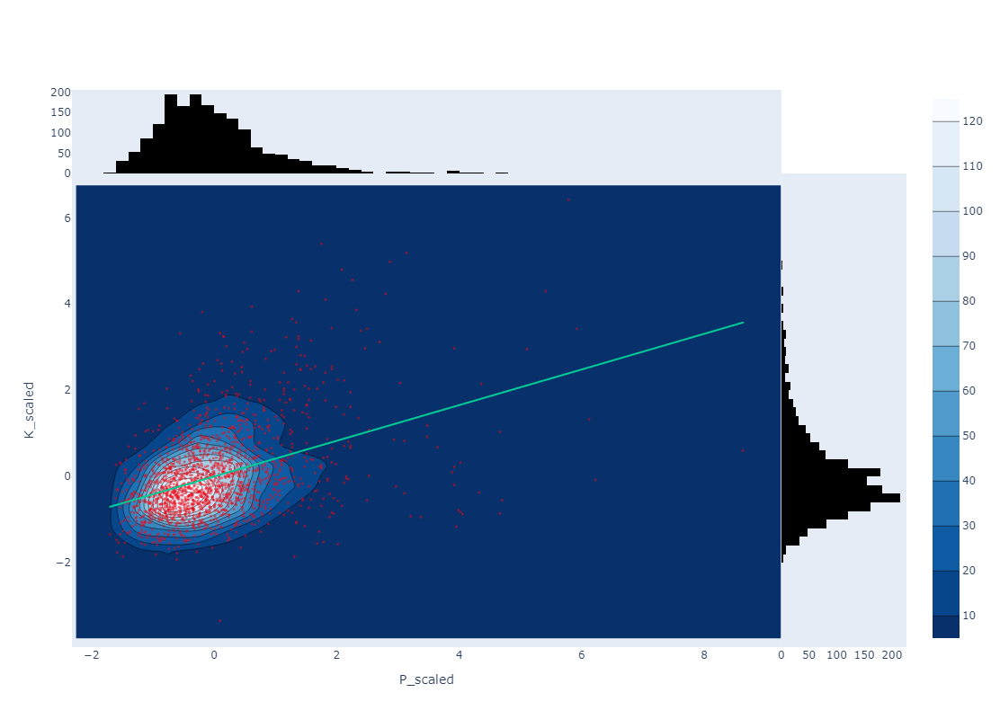

In [205]:
create_plot_histogram_scatter('P_scaled', 'K_scaled')

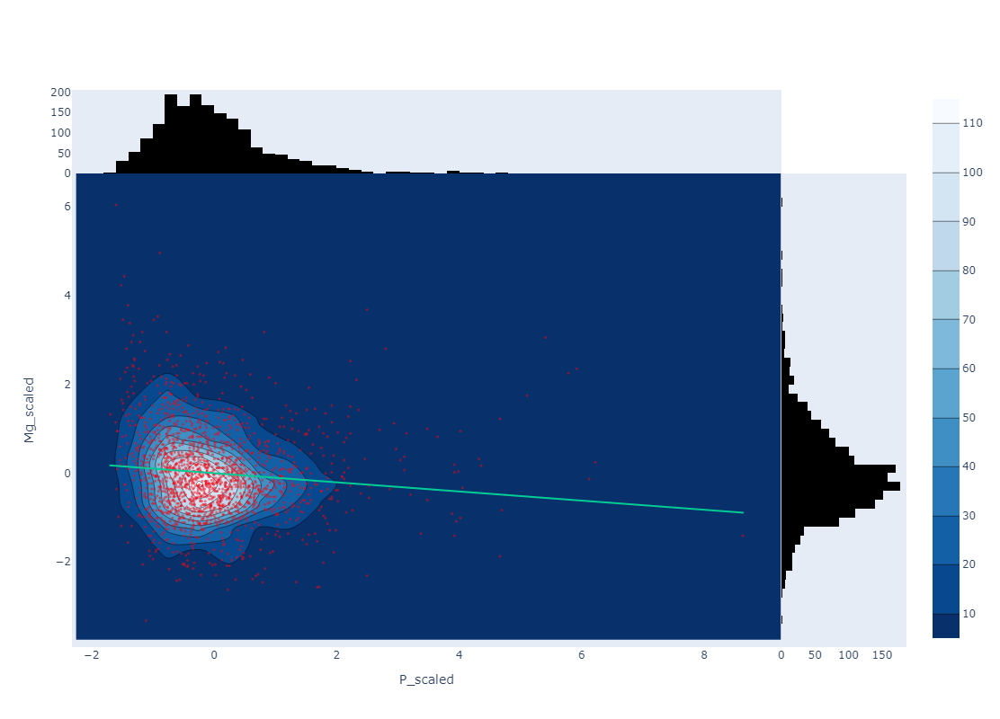

In [206]:
create_plot_histogram_scatter('P_scaled', 'Mg_scaled')

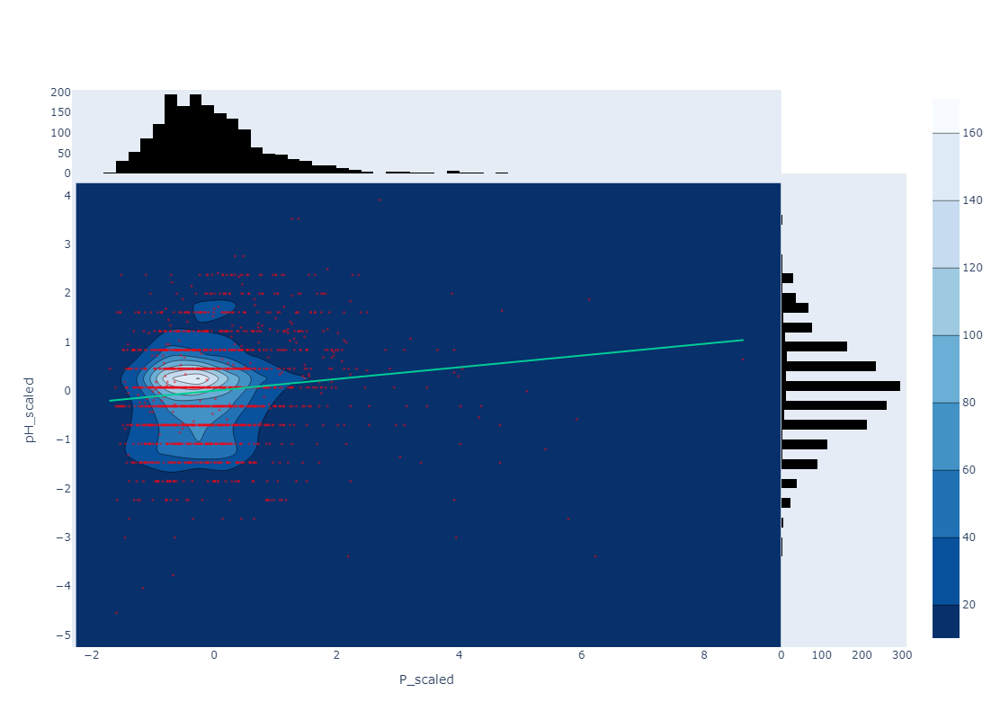

In [207]:
create_plot_histogram_scatter('P_scaled', 'pH_scaled')

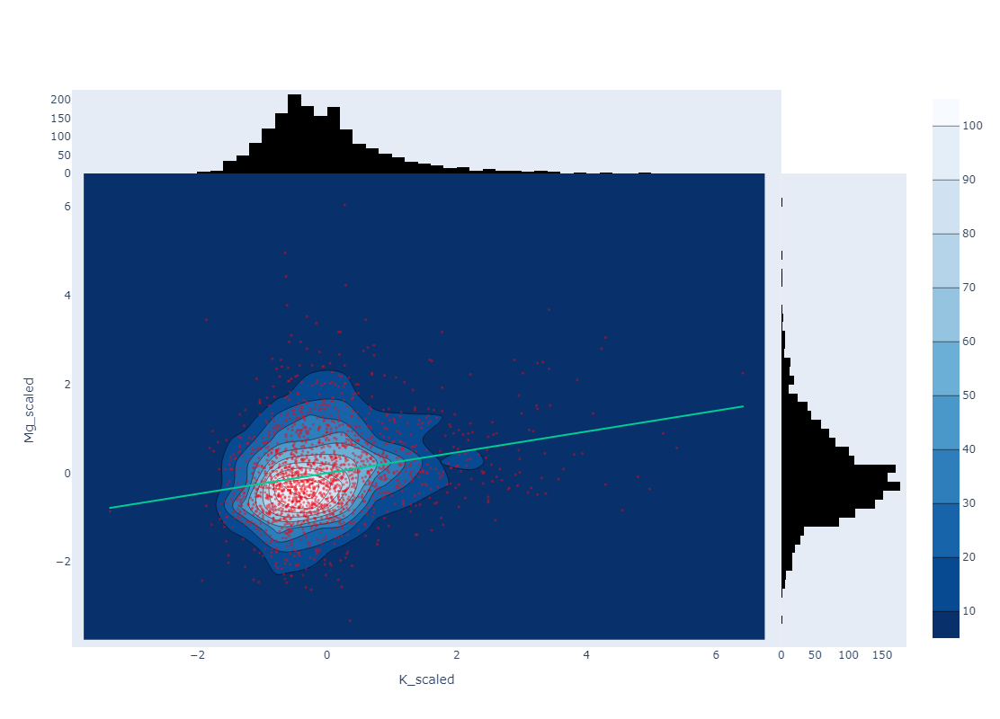

In [219]:
create_plot_histogram_scatter('K_scaled', 'Mg_scaled')

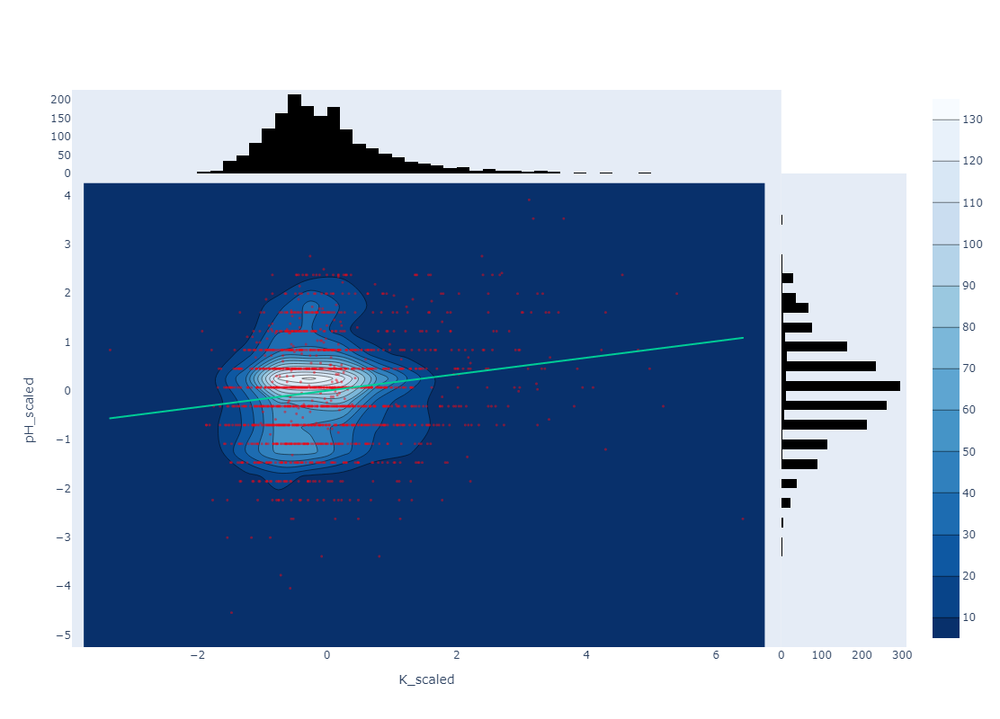

In [209]:
create_plot_histogram_scatter('K_scaled', 'pH_scaled')

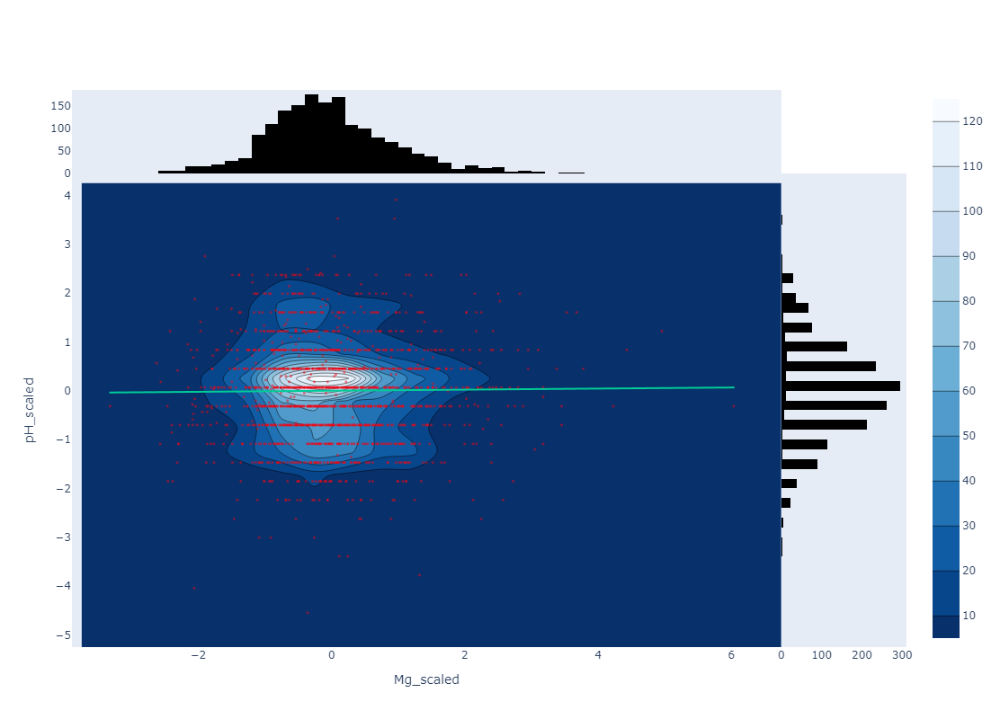

In [210]:
create_plot_histogram_scatter('Mg_scaled', 'pH_scaled')

#### Plots of dependence of parameters in relation to image sizes

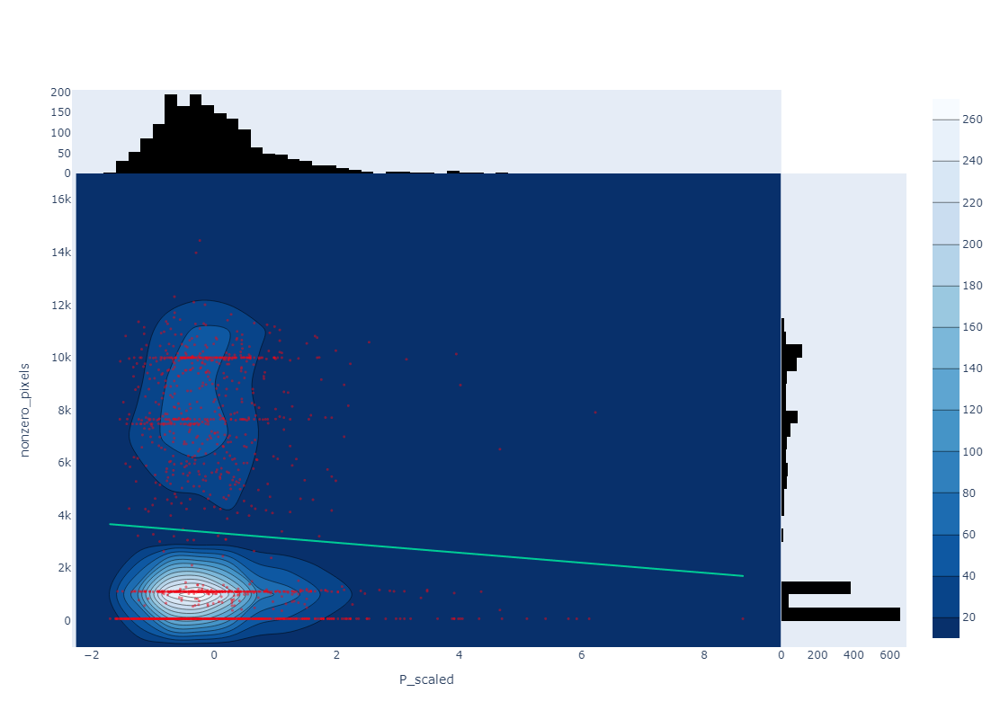

In [218]:
create_plot_histogram_scatter('P_scaled', 'nonzero_pixels')

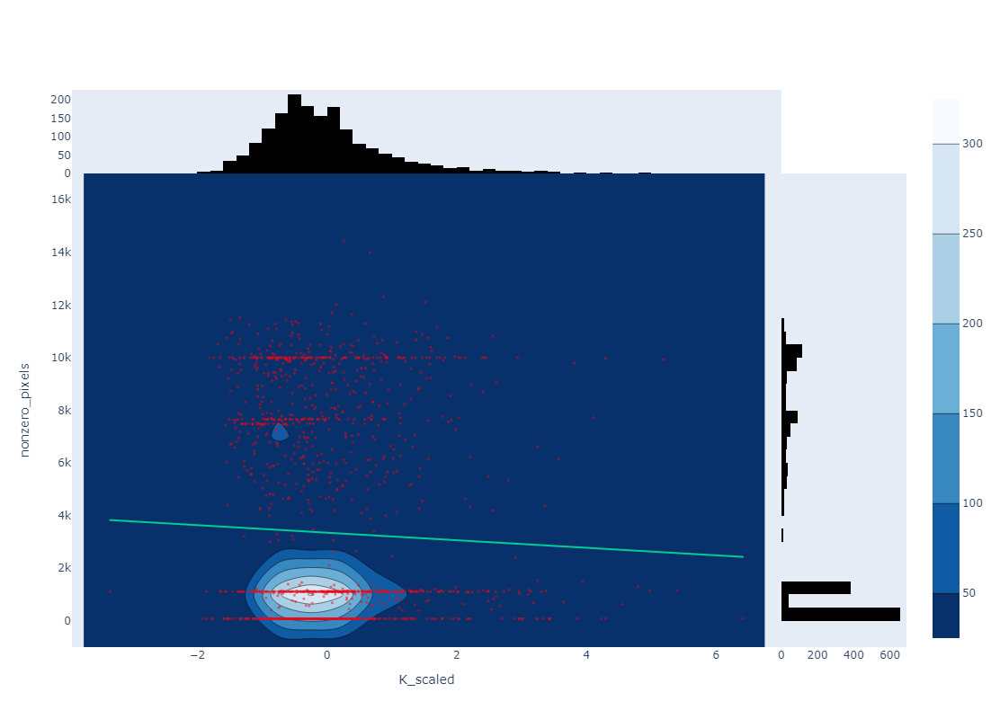

In [214]:
create_plot_histogram_scatter('K_scaled', 'nonzero_pixels')

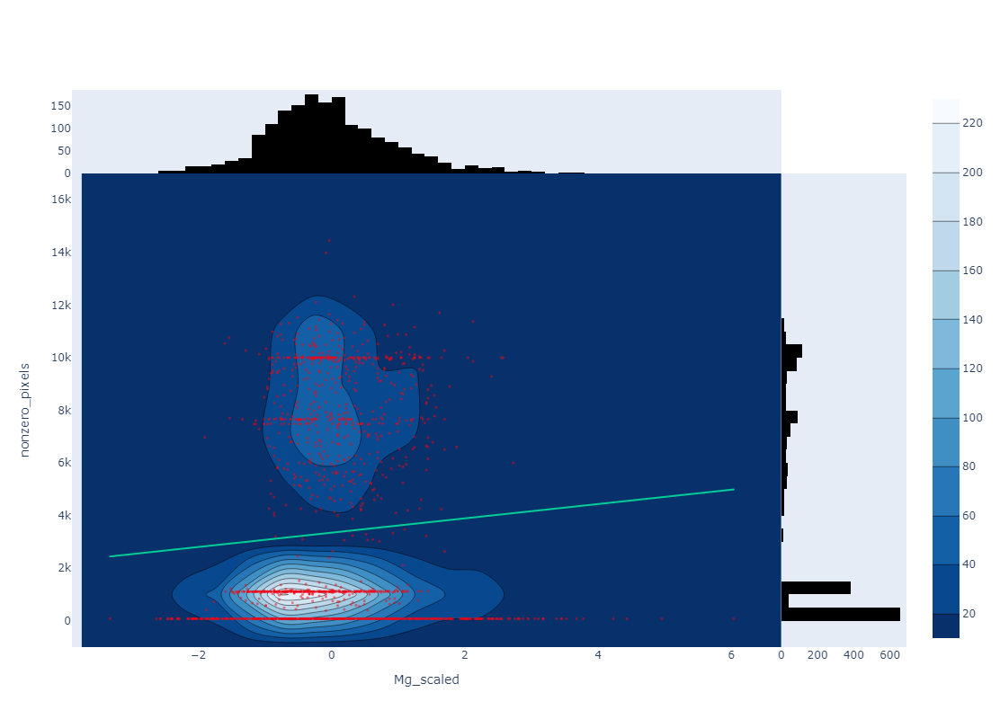

In [215]:
create_plot_histogram_scatter('Mg_scaled', 'nonzero_pixels')

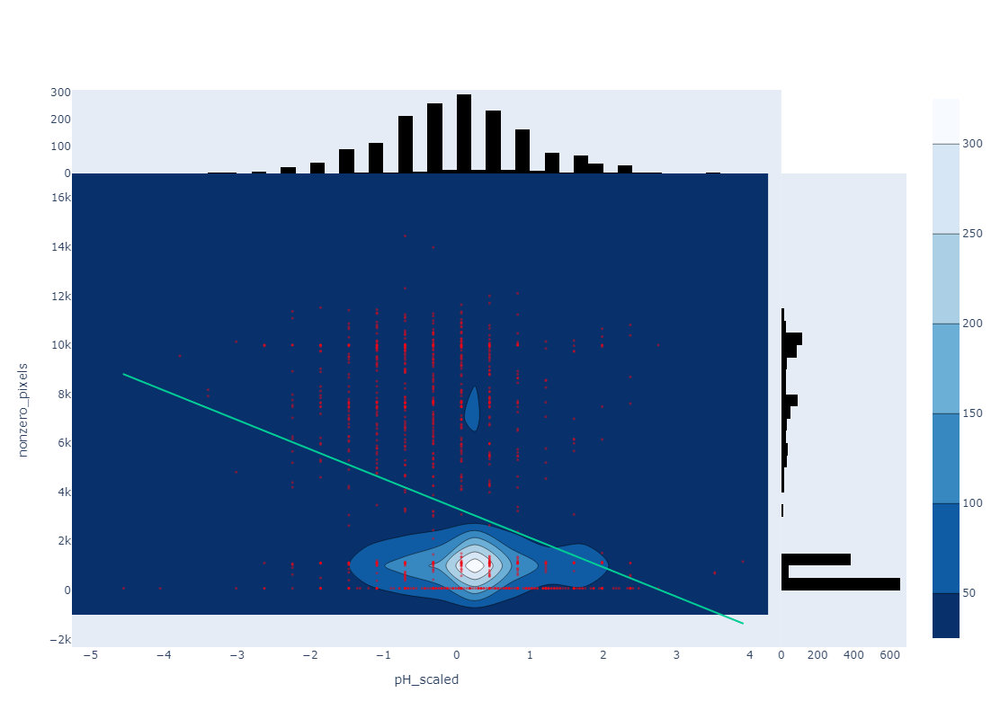

In [216]:
create_plot_histogram_scatter('pH_scaled', 'nonzero_pixels')